<a href="https://colab.research.google.com/github/rsugandha/IBM-Notebooks/blob/master/Toronto_Neighbourhood_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Capstone Battle of the Neighborhoods

## Notebook Setup and installation of modules


In [0]:
import pandas as pd
import numpy as np
import os
import urllib.request

!easy_install beautifulsoup4
from bs4 import BeautifulSoup

from geopy.geocoders import Nominatim

#Install folium
#!pip install folium
import folium

import json # library to handle JSON files

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib

# import k-means from clustering stage
from sklearn.cluster import KMeans

from google.colab import drive
drive.mount('/content/drive')

Searching for beautifulsoup4
Best match: beautifulsoup4 4.6.3
Adding beautifulsoup4 4.6.3 to easy-install.pth file

Using /usr/local/lib/python2.7/dist-packages
Processing dependencies for beautifulsoup4
Finished processing dependencies for beautifulsoup4
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!easy_install beautifulsoup4
!easy_install lxml
!easy_install html5lib
!easy_install folium


Searching for beautifulsoup4
Best match: beautifulsoup4 4.6.3
Adding beautifulsoup4 4.6.3 to easy-install.pth file

Using /usr/local/lib/python2.7/dist-packages
Processing dependencies for beautifulsoup4
Finished processing dependencies for beautifulsoup4
Searching for lxml
Best match: lxml 4.2.6
Adding lxml 4.2.6 to easy-install.pth file

Using /usr/local/lib/python2.7/dist-packages
Processing dependencies for lxml
Finished processing dependencies for lxml
Searching for html5lib
Best match: html5lib 1.0.1
Adding html5lib 1.0.1 to easy-install.pth file

Using /usr/local/lib/python2.7/dist-packages
Processing dependencies for html5lib
Finished processing dependencies for html5lib
Searching for folium
Best match: folium 0.8.3
Adding folium 0.8.3 to easy-install.pth file

Using /usr/local/lib/python2.7/dist-packages
Processing dependencies for folium
Finished processing dependencies for folium


In [0]:
url = "https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M" #Assign URL 
page = urllib.request.urlopen(url) #request URL using urllib and assign to "page"
soup = BeautifulSoup(page, "lxml") #Scrape page using BeautifulSoup package

#Search for tables in the HTML
all_tables=soup.find_all("table")
right_table=soup.find('table', class_='wikitable sortable')


In [0]:
#There are 3 columns in the table therefore 3 lists were created and append values
A=[]
B=[]
C=[]

#searches for string "tr" afterwhich a loop function is which search for the values of td and append the values to the list created above
for row in right_table.findAll('tr'):
    cells=row.findAll('td')
    if len(cells)==3:
        A.append(cells[0].find(text=True))
        B.append(cells[1].find(text=True))
        C.append(cells[2].find(text=True))

In [0]:
df=pd.DataFrame(A,columns=['Postal Code'])#create a dataframe from A and assigns column name as 'Postal Code'
df['Borough'] = B #append column B and assigns name to 'Borough'
df['Neighborhood']=C #append column C and assigns name to 'Neighborhood'
df.head()

,Postal Code,Borough,Neighborhood
0,M1A\n,Not assigned\n,\n
1,M2A\n,Not assigned\n,\n
2,M3A\n,North York\n,Parkwoods\n
3,M4A\n,North York\n,Victoria Village\n
4,M5A\n,Downtown Toronto\n,"Regent Park, Harbourfront\n"


In [0]:
df.replace(r'\n', "", regex=True, inplace = True)

In [0]:
df_cleaned = df[df['Borough'] != 'Not assigned'].reset_index(drop=True) #Created a cleaned dataframe and filter by string name 'Not assigned\n' in column 'Borough'
df_group = df_cleaned.groupby('Postal Code').sum() #group by Postal Code and aggregate strings
df_group.reset_index(inplace = True) #Reset Index
df_group.head(10)

,Postal Code,Borough,Neighborhood
0,M1B,Scarborough,"Malvern, Rouge"
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek"
2,M1E,Scarborough,"Guildwood, Morningside, West Hill"
3,M1G,Scarborough,Woburn
4,M1H,Scarborough,Cedarbrae
5,M1J,Scarborough,Scarborough Village
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park"
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge"
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West"
9,M1N,Scarborough,"Birch Cliff, Cliffside West"


In [0]:
df_group.shape

(103, 3)

In [0]:
df_coords = pd.read_csv('/content/drive/My Drive/DataScience/Geospatial_Coordinates.csv')  
df_coords.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [0]:
df_merged = pd.merge(left=df_group, right=df_coords, how = 'inner') #Merge dataframes using the Postal Code column and join keys "inner" to merge all data
neighborhoods = df_merged
neighborhoods

,Postal Code,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476
...,...,...,...,...,...
98,M9N,York,Weston,43.706876,-79.518188
99,M9P,Etobicoke,Westmount,43.696319,-79.532242
100,M9R,Etobicoke,"Kingsview Village, St. Phillips, Martin Grove ...",43.688905,-79.554724
101,M9V,Etobicoke,"South Steeles, Silverstone, Humbergate, Jamest...",43.739416,-79.588437


## Grouping the Dataframe by Boroughs
Definition of the Borough lat and long is determined by the mean of all postcodes in the Boroughs

In [0]:
boroughs = neighborhoods.groupby('Borough').mean()
boroughs = boroughs.reset_index()
boroughs.columns

Index(['Borough', 'Latitude', 'Longitude'], dtype='object')

In [0]:
address = 'Toronto, CA'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.6534817, -79.3839347.


## Map of Borough Locations
Shows the location of the Boroughs on the map

In [0]:
# create map of New York using latitude and longitude values
map_boroughs = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lng, borough, in zip(boroughs['Latitude'], boroughs['Longitude'], boroughs['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_boroughs)  
    
map_boroughs


In [0]:
map_Postal = folium.Map(location=[latitude, longitude], zoom_start=12)

for lat, lng, borough, in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Postal)  
    
map_Postal

In [0]:
CLIENT_ID = '2DR513HTLHGCZYJUS1SI0Y4YVP5DHOKFPELBBKC4MFUHTP54' # your Foursquare ID
CLIENT_SECRET = '1VAWHQ1250HUDPZ0LBRRJ3PI5ZUFEKO35LE12VX4B1VVV2VS' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 2DR513HTLHGCZYJUS1SI0Y4YVP5DHOKFPELBBKC4MFUHTP54
CLIENT_SECRET:1VAWHQ1250HUDPZ0LBRRJ3PI5ZUFEKO35LE12VX4B1VVV2VS


## Function to Request venues within 500m Radius of Borough Centroids

In [0]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [0]:
boroughs_venues = getNearbyVenues(names=boroughs['Borough'],
                                   latitudes=boroughs['Latitude'],
                                   longitudes=boroughs['Longitude']
                                  )


Central Toronto
Downtown Toronto
East Toronto
East York
Etobicoke
Mississauga
North York
Scarborough
West Toronto
York


In [0]:
boroughs_venues.groupby('Neighborhood').count().reset_index()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,27,27,27,27,27,27
1,Downtown Toronto,71,71,71,71,71,71
2,East Toronto,25,25,25,25,25,25
3,East York,4,4,4,4,4,4
4,Etobicoke,2,2,2,2,2,2
5,Mississauga,12,12,12,12,12,12
6,North York,2,2,2,2,2,2
7,Scarborough,1,1,1,1,1,1
8,West Toronto,42,42,42,42,42,42
9,York,6,6,6,6,6,6


In [0]:
print('There are {} uniques categories.'.format(len(boroughs_venues['Venue Category'].unique())))

There are 95 uniques categories.


In [0]:
# create map of New York using latitude and longitude values
map_boroughs_venues = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, borough, in zip(boroughs_venues['Venue Latitude'], boroughs_venues['Venue Longitude'], boroughs_venues['Venue']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_boroughs_venues)  
    
map_boroughs_venues


In [0]:
# one hot encoding
toronto_onehot = pd.get_dummies(boroughs_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = boroughs_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Women's Store,American Restaurant,Art Gallery,Art Museum,Asian Restaurant,Auto Workshop,Bakery,Bank,Bar,Bistro,Bookstore,Breakfast Spot,Brewery,Bubble Tea Shop,Burrito Place,Business Service,Café,Clothing Store,Cocktail Bar,Coffee Shop,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant,Fast Food Restaurant,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gas Station,Gastropub,Gift Shop,...,Liquor Store,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Movie Theater,Music Venue,Neighborhood,Opera House,Pakistani Restaurant,Park,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pub,Ramen Restaurant,Restaurant,Sandwich Place,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Ski Area,Ski Chalet,Smoothie Shop,Snack Place,Sushi Restaurant,Syrian Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Tibetan Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Central Toronto,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Central Toronto,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Central Toronto,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Central Toronto,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,Central Toronto,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
toronto_grp = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_grp

,Neighborhood,Women's Store,American Restaurant,Art Gallery,Art Museum,Asian Restaurant,Auto Workshop,Bakery,Bank,Bar,Bistro,Bookstore,Breakfast Spot,Brewery,Bubble Tea Shop,Burrito Place,Business Service,Café,Clothing Store,Cocktail Bar,Coffee Shop,Comic Shop,Concert Hall,Convenience Store,Cosmetics Shop,Cuban Restaurant,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant,Fast Food Restaurant,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Gas Station,Gastropub,...,Latin American Restaurant,Liquor Store,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Monument / Landmark,Movie Theater,Music Venue,Opera House,Pakistani Restaurant,Park,Pharmacy,Pizza Place,Playground,Plaza,Poke Place,Pub,Ramen Restaurant,Restaurant,Sandwich Place,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skating Rink,Ski Area,Ski Chalet,Smoothie Shop,Snack Place,Sushi Restaurant,Syrian Restaurant,Tanning Salon,Tea Room,Thai Restaurant,Theater,Tibetan Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Vietnamese Restaurant
0,Central Toronto,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.037037,0.037037,0.037037,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.037037,0.000000,0.000000,0.111111,0.000000,0.000000,0.037037,0.000000,0.00000,0.037037,0.000000,0.000000,0.000000,0.00000,0.00,0.00000,0.000000,0.00000,0.037037,0.000000,0.000000,0.00000,0.037037,...,0.000000,0.00000,0.000000,0.000000,0.037037,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.037037,0.037037,0.00000,0.000000,0.000000,0.000000,0.000000,0.074074,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.0,0.0,0.000000,0.00,0.111111,0.037037,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000
1,Downtown Toronto,0.014085,0.000000,0.014085,0.014085,0.00,0.00000,0.000000,0.014085,0.014085,0.00,0.014085,0.000000,0.000000,0.028169,0.014085,0.0,0.014085,0.084507,0.014085,0.112676,0.014085,0.014085,0.000000,0.028169,0.00000,0.000000,0.014085,0.028169,0.000000,0.00000,0.00,0.00000,0.014085,0.00000,0.000000,0.000000,0.014085,0.00000,0.014085,...,0.014085,0.00000,0.000000,0.014085,0.028169,0.014085,0.014085,0.014085,0.014085,0.014085,0.00,0.00,0.000000,0.014085,0.00000,0.028169,0.014085,0.014085,0.014085,0.028169,0.000000,0.028169,0.014085,0.014085,0.00,0.00,0.0,0.0,0.014085,0.00,0.014085,0.000000,0.014085,0.014085,0.014085,0.028169,0.00,0.014085,0.014085,0.014085
2,East Toronto,0.000000,0.000000,0.000000,0.000000,0.04,0.00000,0.000000,0.000000,0.040000,0.04,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.04,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.040000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.04,0.04,0.000000,0.040000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.04,0.04,0.0,0.0,0.000000,0.04,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.04,0.000000,0.000000,0.000000
3,East York,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000,0.00,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.75,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.0,0.0,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000
4,Etobicoke,0.000000,0.000000,0.000000,0.000000,0.00,0.00000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000

In [0]:
num_top_venues = 5

for hood in toronto_grp['Neighborhood']:
    print("----"+hood+"----")
    temp = toronto_grp[toronto_grp['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Central Toronto----
                venue  freq
0  Italian Restaurant  0.15
1         Coffee Shop  0.11
2    Sushi Restaurant  0.11
3          Restaurant  0.07
4   Indian Restaurant  0.04


----Downtown Toronto----
                       venue  freq
0                Coffee Shop  0.11
1             Clothing Store  0.08
2                      Diner  0.03
3  Middle Eastern Restaurant  0.03
4             Cosmetics Shop  0.03


----East Toronto----
                 venue  freq
0    Indian Restaurant  0.28
1                 Café  0.08
2        Grocery Store  0.08
3  Egyptian Restaurant  0.04
4          Pizza Place  0.04


----East York----
                        venue  freq
0                        Park  0.75
1                Home Service  0.25
2               Women's Store  0.00
3  Modern European Restaurant  0.00
4                  Playground  0.00


----Etobicoke----
            venue  freq
0            Park   0.5
1  Clothing Store   0.5
2   Women's Store   0.0
3             Pub   0.

In [0]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [0]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_grp['Neighborhood']

for ind in np.arange(toronto_grp.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grp.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Central Toronto,Italian Restaurant,Coffee Shop,Sushi Restaurant,Restaurant,Indonesian Restaurant,Convenience Store,Pharmacy,Middle Eastern Restaurant,Café,French Restaurant
1,Downtown Toronto,Coffee Shop,Clothing Store,Cosmetics Shop,Bubble Tea Shop,Restaurant,Plaza,Hotel,Diner,Seafood Restaurant,Theater
2,East Toronto,Indian Restaurant,Grocery Store,Café,Indian Chinese Restaurant,Bar,Pakistani Restaurant,Park,Pizza Place,Egyptian Restaurant,Skating Rink
3,East York,Park,Home Service,Vietnamese Restaurant,Food Truck,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant
4,Etobicoke,Park,Clothing Store,Vietnamese Restaurant,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant
5,Mississauga,Hotel,Coffee Shop,Mediterranean Restaurant,Middle Eastern Restaurant,American Restaurant,Gym,Intersection,Fried Chicken Joint,Sandwich Place,Burrito Place
6,North York,Ski Chalet,Ski Area,Cuban Restaurant,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant
7,Scarborough,Business Service,Vietnamese Restaurant,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant
8,West Toronto,Restaurant,Coffee Shop,Bookstore,Gift Shop,Café,Brewery,Breakfast Spot,Pub,Playground,Gourmet Shop
9,York,Convenience Store,Coffee Shop,Dessert Shop,Restaurant,Sandwich Place,Discount Store,Cosmetics Shop,Cuban Restaurant,Deli / Bodega,Diner


In [0]:
# set number of clusters
kclusters = 6

toronto_grouped_clustering = toronto_grp.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init="k-means++", n_init=20).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 0, 5, 2, 4, 0, 3, 1, 0, 0], dtype=int32)

In [0]:
# add clustering labels

neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged = boroughs.rename(columns={'Borough':"Neighborhood"})

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

toronto_merged.head() # check the last columns!
print(toronto_merged.shape)

(10, 14)


In [0]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 0, toronto_merged.columns[[0] + list(range(3, toronto_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Central Toronto,0,Italian Restaurant,Coffee Shop,Sushi Restaurant,Restaurant,Indonesian Restaurant,Convenience Store,Pharmacy,Middle Eastern Restaurant,Café,French Restaurant
1,Downtown Toronto,0,Coffee Shop,Clothing Store,Cosmetics Shop,Bubble Tea Shop,Restaurant,Plaza,Hotel,Diner,Seafood Restaurant,Theater
5,Mississauga,0,Hotel,Coffee Shop,Mediterranean Restaurant,Middle Eastern Restaurant,American Restaurant,Gym,Intersection,Fried Chicken Joint,Sandwich Place,Burrito Place
8,West Toronto,0,Restaurant,Coffee Shop,Bookstore,Gift Shop,Café,Brewery,Breakfast Spot,Pub,Playground,Gourmet Shop
9,York,0,Convenience Store,Coffee Shop,Dessert Shop,Restaurant,Sandwich Place,Discount Store,Cosmetics Shop,Cuban Restaurant,Deli / Bodega,Diner


In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, toronto_merged.columns[[0] + list(range(4, toronto_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,Scarborough,Business Service,Vietnamese Restaurant,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant


In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 2, toronto_merged.columns[[0] + list(range(4, toronto_merged.shape[1]))]]


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,East York,Park,Home Service,Vietnamese Restaurant,Food Truck,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant


In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 3, toronto_merged.columns[[0] + list(range(4, toronto_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,North York,Ski Chalet,Ski Area,Cuban Restaurant,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant,Falafel Restaurant


In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 4, toronto_merged.columns[[0] + list(range(4, toronto_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,Etobicoke,Park,Clothing Store,Vietnamese Restaurant,Cosmetics Shop,Deli / Bodega,Dessert Shop,Diner,Discount Store,Eastern European Restaurant,Egyptian Restaurant


In [0]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 5, toronto_merged.columns[[0] + list(range(4, toronto_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,East Toronto,Indian Restaurant,Grocery Store,Café,Indian Chinese Restaurant,Bar,Pakistani Restaurant,Park,Pizza Place,Egyptian Restaurant,Skating Rink


#Get Venues within a 1500m radius of Postal Codes

In [0]:
def getNearbyVenues(names, borough, latitudes, longitudes, radius=1500, limit = 100):
    
    venues_list=[]
    for name, borough, lat, lng in zip(names, borough, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            borough,
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Postal Code', 
                  'Borough',
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

postal_venues = getNearbyVenues(names=neighborhoods['Postal Code'],
                                borough=neighborhoods['Borough'],
                                latitudes=neighborhoods['Latitude'],
                                longitudes=neighborhoods['Longitude']
                                  )


M1B
M1C
M1E
M1G
M1H
M1J
M1K
M1L
M1M
M1N
M1P
M1R
M1S
M1T
M1V
M1W
M1X
M2H
M2J
M2K
M2L
M2M
M2N
M2P
M2R
M3A
M3B
M3C
M3H
M3J
M3K
M3L
M3M
M3N
M4A
M4B
M4C
M4E
M4G
M4H
M4J
M4K
M4L
M4M
M4N
M4P
M4R
M4S
M4T
M4V
M4W
M4X
M4Y
M5A
M5B
M5C
M5E
M5G
M5H
M5J
M5K
M5L
M5M
M5N
M5P
M5R
M5S
M5T
M5V
M5W
M5X
M6A
M6B
M6C
M6E
M6G
M6H
M6J
M6K
M6L
M6M
M6N
M6P
M6R
M6S
M7A
M7R
M7Y
M8V
M8W
M8X
M8Y
M8Z
M9A
M9B
M9C
M9L
M9M
M9N
M9P
M9R
M9V
M9W


In [0]:
postal_venues.groupby('Postal Code').count().sort_values('Venue')

,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Postal Code,,,,,,,
M1X,2,2,2,2,2,2,2
M3L,9,9,9,9,9,9,9
M1C,10,10,10,10,10,10,10
M1N,14,14,14,14,14,14,14
M2K,15,15,15,15,15,15,15
...,...,...,...,...,...,...,...
M5T,100,100,100,100,100,100,100
M5W,100,100,100,100,100,100,100
M5X,100,100,100,100,100,100,100


In [0]:
postal_venues.shape

(6898, 8)

In [0]:
print('There are {} uniques categories.'.format(len(postal_venues['Venue Category'].unique())))

There are 352 uniques categories.


In [0]:
#postal_venues.to_csv('/content/drive/My Drive/DataScience/Venues_toronto_full.csv', header = True , index = True) #Save Dataframe to CSV inorder to save on API calls

# SHOW VENUE LOCATIONS ON MAP OF TORONTO

In [0]:
# create map of New York using latitude and longitude values
map_postal_venues = folium.Map(location=[latitude, longitude], zoom_start=11, tiles = 'cartodbpositron')

for lat, lng, borough, in zip(postal_venues['Venue Latitude'], postal_venues['Venue Longitude'], postal_venues['Venue']):
    label = '{}'.format(borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.5,
        parse_html=False).add_to(map_postal_venues)  
    
map_postal_venues

# Data Preparation for K-means Cluster modelling

## One Hot Encoding of Venue

In [0]:
# one hot encoding
tor_onehot = pd.get_dummies(postal_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
tor_onehot['Postal Code'] = postal_venues['Postal Code'] 

# move neighborhood column to the first column
fixed_columns = [tor_onehot.columns[-1]] + list(tor_onehot.columns[:-1])
tor_onehot = tor_onehot[fixed_columns]

tor_onehot.shape

(6898, 353)

In [0]:
tor_grp = tor_onehot.groupby('Postal Code').mean().reset_index()
tor_grp

,Postal Code,ATM,Accessories Store,Afghan Restaurant,African Restaurant,Airport,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Big Box Store,Bike Shop,Bistro,...,Syrian Restaurant,Szechuan Restaurant,Taco Place,Taiwanese Restaurant,Tapas Restaurant,Tattoo Parlor,Tea Room,Tech Startup,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Track,Trail,Train Station,Transportation Service,Turkish Restaurant,Udon Restaurant,University,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,M1B,0.0,0.0,0.0,0.028571,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.028571,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.028571,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.028571,0.000000,0.0,0.0,0.0,0.0,0.0,0.028571,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.028571,0.0,0.000000,0.0,0.285714
1,M1C,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000
2,M1E,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.029412,0.000000,0.000000,0.000000,0.029412,0.0,0.0,0.0,0.0,0.000000,0.058824,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.029412,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.029412,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000
3,M1G,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.029412,0.058824,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.029412,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.029412,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.029412,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000
4,M1H,0.0,0.0,0.0,0.000000,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.014706,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.044118,0.029412,0.014706,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.014706,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.014706,0.0,0.0,0.0,0.0,0.000000,0.0,0.014706,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.014706,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.014706,0.014706,0.0,0.014706,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,M9N,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.020408,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.020408,0.040816,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.020408,0.0,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.

In [0]:
num_top_venues = 5

for hood in tor_grp['Postal Code']:
    print("----"+hood+"----")
    temp = tor_grp[tor_grp['Postal Code'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----M1B----
                           venue  freq
0                    Zoo Exhibit  0.29
1                     Restaurant  0.09
2                    Pizza Place  0.06
3           Fast Food Restaurant  0.06
4  Paper / Office Supplies Store  0.03


----M1C----
                  venue  freq
0                  Park   0.2
1        Breakfast Spot   0.1
2  Gym / Fitness Center   0.1
3    Italian Restaurant   0.1
4                   Gym   0.1


----M1E----
                  venue  freq
0           Pizza Place  0.09
1           Coffee Shop  0.06
2        Breakfast Spot  0.06
3                  Bank  0.06
4  Fast Food Restaurant  0.06


----M1G----
                  venue  freq
0           Coffee Shop  0.18
1              Pharmacy  0.09
2  Fast Food Restaurant  0.09
3                  Bank  0.06
4           Pizza Place  0.06


----M1H----
               venue  freq
0        Coffee Shop  0.09
1        Gas Station  0.04
2             Bakery  0.04
3         Restaurant  0.04
4  Indian Restaurant  0

In [0]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [0]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Postal Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
postal_venues_sorted = pd.DataFrame(columns=columns)
postal_venues_sorted['Postal Code'] = tor_grp['Postal Code']

for ind in np.arange(tor_grp.shape[0]):
    postal_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tor_grp.iloc[ind, :], num_top_venues)

postal_venues_sorted.shape

(103, 6)

In [0]:
# set number of clusters
kclusters = 8

toronto_clustering = tor_grp.drop('Postal Code', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, init="k-means++", n_init=30, random_state = 5).fit(toronto_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([5, 3, 6, 6, 0, 6, 6, 6, 6, 3], dtype=int32)

In [0]:
# add clustering labels

postal_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

tor_merged = neighborhoods

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
tor_merged = tor_merged.join(postal_venues_sorted.set_index('Postal Code'), on='Postal Code')

tor_merged.head() # check the last columns!

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353,5,Zoo Exhibit,Restaurant,Fast Food Restaurant,Pizza Place,Women's Store
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,3,Park,Burger Joint,Grocery Store,Breakfast Spot,Gym / Fitness Center
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711,6,Pizza Place,Restaurant,Fast Food Restaurant,Coffee Shop,Bank
3,M1G,Scarborough,Woburn,43.770992,-79.216917,6,Coffee Shop,Pharmacy,Fast Food Restaurant,Pizza Place,Sandwich Place
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,0,Coffee Shop,Bakery,Restaurant,Gas Station,Clothing Store


In [0]:
tor_merged[tor_merged.isna().any(axis=1)]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


In [0]:
# create map
Postal_clusters = folium.Map(location=[latitude, longitude], zoom_start=11, tiles = 'cartodbpositron')

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(tor_merged['Latitude'], tor_merged['Longitude'], tor_merged['Borough'], tor_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.5).add_to(Postal_clusters)
       
Postal_clusters

In [0]:
sorted = tor_merged.loc[tor_merged['Cluster Labels'] == 0, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]
sorted.sort_values(by=['1st Most Common Venue', '2nd Most Common Venue','3rd Most Common Venue'])

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
95,M9C,Etobicoke,"Eringate, Bloordale Gardens, Old Burnhamthorpe...",43.643515,-79.577201,0,Baseball Field,Coffee Shop,Bank,Pizza Place,Convenience Store
71,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,0,Clothing Store,Fast Food Restaurant,Coffee Shop,Restaurant,Furniture / Home Store
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,0,Coffee Shop,Bakery,Restaurant,Gas Station,Clothing Store
20,M2L,North York,"York Mills, Silver Hills",43.757490,-79.374714,0,Coffee Shop,Bank,Furniture / Home Store,Gas Station,Sandwich Place
23,M2P,North York,York Mills West,43.752758,-79.400049,0,Coffee Shop,Bank,Japanese Restaurant,Sandwich Place,Fast Food Restaurant
39,M4H,East York,Thorncliffe Park,43.705369,-79.349372,0,Coffee Shop,Bank,Restaurant,Sandwich Place,Electronics Store
18,M2J,North York,"Fairview, Henry Farm, Oriole",43.778517,-79.346556,0,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Bank,Gas Station
102,M9W,Etobicoke,"Northwest, West Humber - Clairville",43.706748,-79.594054,0,Coffee Shop,Department Store,Sandwich Place,Mediterranean Restaurant,Gas Station
86,M7R,Mississauga,Canada Post Gateway Processing Centre,43.636966,-79.615819,0,Coffee Shop,Hotel,Middle Eastern Restaurant,Breakfast Spot,Asian Restaurant
26,M3B,North York,Don Mills,43.745906,-79.352188,0,Coffee Shop,Japanese Restaurant,Bank,Pizza Place,Restaurant


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 1, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
16,M1X,Scarborough,Upper Rouge,43.836125,-79.205636,1,Farm,National Park,Zoo Exhibit,Filipino Restaurant,Electronics Store


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 2, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
19,M2K,North York,Bayview Village,43.786947,-79.385975,2,Grocery Store,Park,Trail,Gas Station,Bank
24,M2R,North York,"Willowdale, Willowdale West",43.782736,-79.442259,2,Coffee Shop,Park,Pizza Place,Middle Eastern Restaurant,Sandwich Place
28,M3H,North York,"Bathurst Manor, Wilson Heights, Downsview North",43.754328,-79.442259,2,Park,Coffee Shop,Bank,Gas Station,Pizza Place
31,M3L,North York,Downsview,43.739015,-79.506944,2,Bank,Moving Target,Plaza,Spa,Pizza Place
94,M9B,Etobicoke,"West Deane Park, Princess Gardens, Martin Grov...",43.650943,-79.554724,2,Park,Hotel,Transportation Service,Pizza Place,Coffee Shop
99,M9P,Etobicoke,Westmount,43.696319,-79.532242,2,Bank,Pizza Place,Coffee Shop,Grocery Store,Fried Chicken Joint


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 3, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
1,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",43.784535,-79.160497,3,Park,Burger Joint,Grocery Store,Breakfast Spot,Gym / Fitness Center
9,M1N,Scarborough,"Birch Cliff, Cliffside West",43.692657,-79.264848,3,Park,Ice Cream Shop,Café,Thai Restaurant,Gym
30,M3K,North York,Downsview,43.737473,-79.464763,3,Athletics & Sports,Racetrack,Gym / Fitness Center,Coffee Shop,Park
36,M4C,East York,Woodbine Heights,43.695344,-79.318389,3,Coffee Shop,Pharmacy,Pizza Place,Park,Bank
40,M4J,East York,"East Toronto, Broadview North (Old East York)",43.685347,-79.338106,3,Café,Coffee Shop,Greek Restaurant,Pizza Place,Thai Restaurant
41,M4K,East Toronto,"The Danforth West, Riverdale",43.679557,-79.352188,3,Café,Greek Restaurant,Park,Coffee Shop,Pizza Place
42,M4L,East Toronto,"India Bazaar, The Beaches West",43.668999,-79.315572,3,Park,Coffee Shop,Indian Restaurant,Brewery,Bakery
43,M4M,East Toronto,Studio District,43.659526,-79.340923,3,Coffee Shop,Pizza Place,Café,Bar,Diner
44,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790,3,Coffee Shop,Sushi Restaurant,Italian Restaurant,Bakery,Sandwich Place
45,M4P,Central Toronto,Davisville North,43.712751,-79.390197,3,Italian Restaurant,Coffee Shop,Park,Restaurant,Indian Restaurant


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 4, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
93,M9A,Etobicoke,"Islington Avenue, Humber Valley Village",43.667856,-79.532242,4,Pharmacy,Bank,Shopping Mall,Bus Line,Bakery


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 5, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353,5,Zoo Exhibit,Restaurant,Fast Food Restaurant,Pizza Place,Women's Store


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 6, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711,6,Pizza Place,Restaurant,Fast Food Restaurant,Coffee Shop,Bank
3,M1G,Scarborough,Woburn,43.770992,-79.216917,6,Coffee Shop,Pharmacy,Fast Food Restaurant,Pizza Place,Sandwich Place
5,M1J,Scarborough,Scarborough Village,43.744734,-79.239476,6,Sandwich Place,Pharmacy,Ice Cream Shop,Grocery Store,Bank
6,M1K,Scarborough,"Kennedy Park, Ionview, East Birchmount Park",43.727929,-79.262029,6,Chinese Restaurant,Pharmacy,Coffee Shop,Sandwich Place,Pizza Place
7,M1L,Scarborough,"Golden Mile, Clairlea, Oakridge",43.711112,-79.284577,6,Coffee Shop,Pizza Place,Grocery Store,Hardware Store,Park
8,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West",43.716316,-79.239476,6,Park,Harbor / Marina,Pharmacy,Ice Cream Shop,Pub
10,M1P,Scarborough,"Dorset Park, Wexford Heights, Scarborough Town...",43.757410,-79.273304,6,Coffee Shop,Restaurant,Indian Restaurant,Pizza Place,Chinese Restaurant
12,M1S,Scarborough,Agincourt,43.794200,-79.262029,6,Chinese Restaurant,Coffee Shop,Cantonese Restaurant,Bakery,Caribbean Restaurant
13,M1T,Scarborough,"Clarks Corners, Tam O'Shanter, Sullivan",43.781638,-79.304302,6,Coffee Shop,Fast Food Restaurant,Bank,Pizza Place,Park
14,M1V,Scarborough,"Milliken, Agincourt North, Steeles East, L'Amo...",43.815252,-79.284577,6,Chinese Restaurant,Korean Restaurant,Dessert Shop,Pharmacy,Noodle House


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 7, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
46,M4R,Central Toronto,"North Toronto West, Lawrence Park",43.715383,-79.405678,7,Coffee Shop,Italian Restaurant,Café,Clothing Store,Bakery
51,M4X,Downtown Toronto,"St. James Town, Cabbagetown",43.667967,-79.367675,7,Café,Coffee Shop,Park,Japanese Restaurant,Gastropub
52,M4Y,Downtown Toronto,Church and Wellesley,43.665860,-79.383160,7,Coffee Shop,Japanese Restaurant,Park,Gastropub,Diner
53,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,7,Coffee Shop,Café,Park,Restaurant,Japanese Restaurant
54,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937,7,Coffee Shop,Gastropub,Café,Japanese Restaurant,Restaurant
55,M5C,Downtown Toronto,St. James Town,43.651494,-79.375418,7,Coffee Shop,Café,Restaurant,Thai Restaurant,Hotel
56,M5E,Downtown Toronto,Berczy Park,43.644771,-79.373306,7,Coffee Shop,Hotel,Café,Italian Restaurant,Plaza
57,M5G,Downtown Toronto,Central Bay Street,43.657952,-79.387383,7,Park,Coffee Shop,Japanese Restaurant,Café,Pizza Place
58,M5H,Downtown Toronto,"Richmond, Adelaide, King",43.650571,-79.384568,7,Coffee Shop,Park,Japanese Restaurant,Café,Plaza
59,M5J,Downtown Toronto,"Harbourfront East, Union Station, Toronto Islands",43.640816,-79.381752,7,Coffee Shop,Hotel,Café,Park,Gym


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 8, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


In [0]:
tor_merged.loc[tor_merged['Cluster Labels'] == 9, tor_merged.columns[[0] + list(range(1, tor_merged.shape[1]))]]

,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue


# Establish the Frequency of Venue Categories

The top 3 venues that appear in Toronto are restaurants, Coffee Shops and Cafe

In [0]:
restaurants = postal_venues[postal_venues['Venue Category'].str.contains("Restaurant")]
Coffee = postal_venues[postal_venues['Venue Category'].str.contains("Coffee")]
Café = postal_venues[postal_venues['Venue Category'].str.contains("Café")]

frames = [restaurants, Coffee, Café]
results = pd.concat(frames)

popular = results['Venue Category'].value_counts()
popular = popular.to_frame()

restaurants_count = restaurants['Venue Category'].value_counts()
rest_top10 = restaurants_count.head(10)


In [0]:
postal_venues[postal_venues['Venue Category'].str.contains("Italian Restaurant")]

,Postal Code,Borough,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
36,M1C,Scarborough,43.784535,-79.160497,Fratelli Village Pizzeria,43.784008,-79.169787,Italian Restaurant
148,M1H,Scarborough,43.773136,-79.239476,Scaddabush Italian Kitchen & Bar,43.777460,-79.254358,Italian Restaurant
370,M1P,Scarborough,43.757410,-79.273304,Nova Ristorante,43.749434,-79.277630,Italian Restaurant
433,M1R,Scarborough,43.750072,-79.295849,Nova Ristorante,43.749434,-79.277630,Italian Restaurant
522,M1T,Scarborough,43.781638,-79.304302,Remezzo Italian Bistro,43.778649,-79.308264,Italian Restaurant
...,...,...,...,...,...,...,...,...
6516,M8Y,Etobicoke,43.636258,-79.498509,Roccos Plum Tomato,43.630335,-79.485012,Italian Restaurant
6595,M8Z,Etobicoke,43.628841,-79.520999,Rocco's Plum Tomato,43.634898,-79.519951,Italian Restaurant
6698,M9L,North York,43.756303,-79.565963,Albertos Trattoria,43.748744,-79.560714,Italian Restaurant
6713,M9M,North York,43.724766,-79.532242,Jolly II Italian Restaurant,43.711946,-79.531510,Italian Restaurant


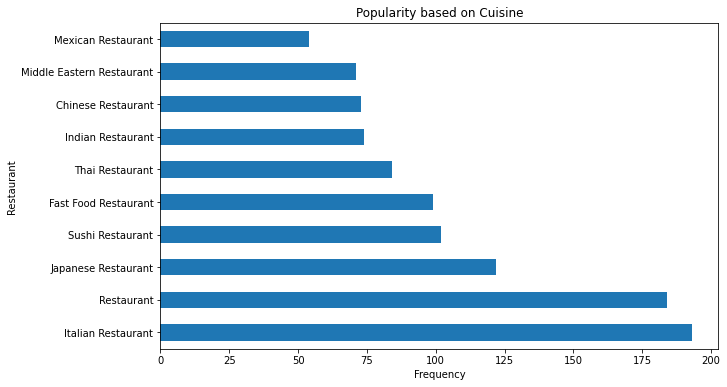

In [0]:
import matplotlib.pyplot as plt
rest_top10.plot(kind='barh', figsize=(10, 6))

plt.title('Popularity based on Cuisine')
plt.ylabel('Restaurant')
plt.xlabel('Frequency')

plt.show()

TOP 3 Cuisines are Italian, Japanense and Fast Food. You will notice there is a large classification of uncaetegorised Restaurants, further investigation would be required to assign these venues to the right categories to establish a report with greater accuracy.

In [0]:
a = tor_merged.loc[tor_merged['Cluster Labels'] == 0]
#a[a['1st Most Common Venue'].str.contains("Italian Restaurant")]
a



,Postal Code,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,0,Coffee Shop,Bakery,Restaurant,Gas Station,Clothing Store
11,M1R,Scarborough,"Wexford, Maryvale",43.750072,-79.295849,0,Middle Eastern Restaurant,Pizza Place,Breakfast Spot,Coffee Shop,Burger Joint
18,M2J,North York,"Fairview, Henry Farm, Oriole",43.778517,-79.346556,0,Coffee Shop,Clothing Store,Middle Eastern Restaurant,Bank,Gas Station
20,M2L,North York,"York Mills, Silver Hills",43.757490,-79.374714,0,Coffee Shop,Bank,Furniture / Home Store,Gas Station,Sandwich Place
21,M2M,North York,"Willowdale, Newtonbrook",43.789053,-79.408493,0,Korean Restaurant,Coffee Shop,Café,Restaurant,Bubble Tea Shop
22,M2N,North York,"Willowdale, Willowdale East",43.770120,-79.408493,0,Korean Restaurant,Bubble Tea Shop,Coffee Shop,Grocery Store,Ramen Restaurant
23,M2P,North York,York Mills West,43.752758,-79.400049,0,Coffee Shop,Bank,Japanese Restaurant,Sandwich Place,Fast Food Restaurant
26,M3B,North York,Don Mills,43.745906,-79.352188,0,Coffee Shop,Japanese Restaurant,Bank,Pizza Place,Restaurant
27,M3C,North York,Don Mills,43.725900,-79.340923,0,Coffee Shop,Restaurant,Gym,Japanese Restaurant,Park
29,M3J,North York,"Northwood Park, York University",43.767980,-79.487262,0,Coffee Shop,Pizza Place,Fast Food Restaurant,Furniture / Home Store,Chinese Restaurant
